In [9]:
from pathlib import Path

import geopandas as gpd
import pandas as pd
import plotly.express as px

In [2]:
spain_map = gpd.read_file("../data/maps/spain-map.geojson")

In [3]:
data_dir = Path("../data/cleaned/olive-oil/")

In [4]:
provinces_name_mapping = {
    "Alava": "Álava",
    "Avila": "Ávila",
    "Huelva ": "Huelva",
    "S.C. de Tenerife": "Santa Cruz de Tenerife",
    "Guipúzcoa": "Gipuzkoa",
    "Vizcaya": "Bizkaia",
    "P. DE ASTURIAS": "Asturias",
    "BALEARES": "Illes Balears",
    "R. DE MURCIA": "Murcia",
    "CANTABRIA": "Cantabria",
    "LA RIOJA": "La Rioja",
    "MADRID": "Madrid",
    "NAVARRA": "Navarra",
}

In [5]:
def normalize_province_name(input_province_name: str) -> str:
    if input_province_name in provinces_name_mapping.keys():
        return provinces_name_mapping.get(input_province_name)
    return input_province_name

In [6]:
df_list = []

for year in range(2007, 2024):
    year_data_path = data_dir / str(year)
    excel_files = list(year_data_path.glob("*provincial*"))
    df = pd.read_excel(excel_files[0], na_values=["–"])

    df.columns = ["province", "extra", "virgin", "lampante"]

    df["year"] = year - 1
    df["province"] = df["province"].str.strip()
    df["province"] = df["province"].apply(normalize_province_name)

    df = df[df["province"].isin(spain_map["ADM2_NAME"])].fillna(0)

    df_list.append(df)

In [8]:
data = pd.concat(df_list)

In [12]:
data.head()

,province,extra,virgin,lampante,year
0,Álava,25.0,116.0,0.0,2006
1,Gipuzkoa,0.0,1.0,0.0,2006
2,Huesca,1080.0,1082.0,0.0,2006
3,Teruel,2836.0,315.0,760.0,2006
4,Zaragoza,2723.0,1669.0,0.0,2006


In [16]:
data = pd.melt(
    frame=data,
    id_vars=["province", "year"],
    value_vars=["extra", "virgin", "lampante"],
    var_name="oil_type",
)

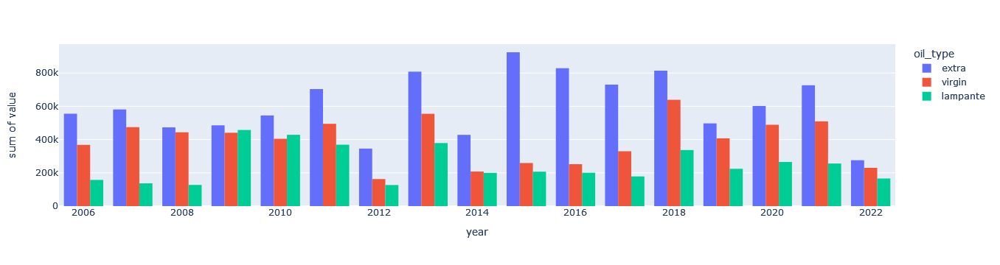

In [18]:
fig = px.histogram(
    data_frame=data, x="year", y="value", color="oil_type", barmode="group"
)

fig.show()

In [31]:
(
    spain_map.merge(
        right=data[(data["year"] == 2022) & (data["oil_type"] == "extra")],
        left_on="ADM2_NAME",
        right_on="province",
    ).loc[:, ["province", "value", "geometry"]]
).explore(column="value")

In [39]:
data.groupby(by=["province", "oil_type"], as_index=False).aggregate(
    total=pd.NamedAgg(column="value", aggfunc="sum")
).sort_values(by="total", ascending=False).head(10)

,province,oil_type,total
71,Jaén,virgin,3394655.0
69,Jaén,extra,2340936.0
70,Jaén,lampante,2297320.0
45,Córdoba,extra,1646352.0
47,Córdoba,virgin,1646086.0
54,Granada,extra,1232643.0
117,Sevilla,extra,1008810.0
46,Córdoba,lampante,967944.0
93,Málaga,extra,840865.0
33,Ciudad Real,extra,732511.0


In [40]:
top_provinces = ["Jaén", "Córdoba", "Granada", "Sevilla", "Málaga", "Ciudad Real"]

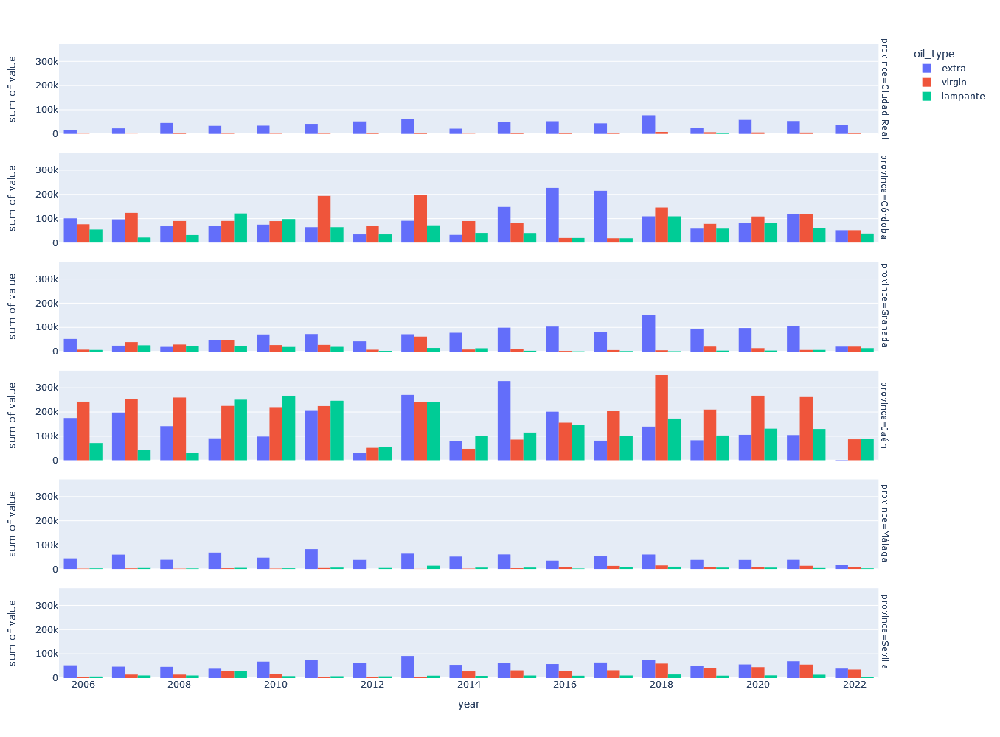

In [47]:
fig = px.histogram(
    data_frame=data[data["province"].isin(top_provinces)],
    x="year",
    y="value",
    color="oil_type",
    facet_row="province",
    height=1000,
    barmode="group",
)

fig.show()